In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from scipy.ndimage import affine_transform
import pandas as pd

image_path = "FlowerPinwheel.jpg"
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
img = img.astype(np.float64) / 255.0 

h, w = img.shape
cntr_offset = [10, 100]
center = (w // 2 - cntr_offset[0], h // 2 - cntr_offset[1])

# Define angle range
thetas = np.deg2rad(np.arange(0, 360, 6))

# mask_GLOB = []

def img_symmetry_process(img, thetas, h, w, center):
    
    def apply_affine(img, M):
        return cv2.warpAffine(img, M[:2], (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=0)
        # return affine_transform(img, M[:2], offset=cntr_offset)
    
    def transformation_info(original, transformed):
        mask = (transformed > 0) & (original > 0)

        # print(np.sum(mask))
        # mask_GLOB.append(np.sum(mask))
        original_act = original[mask]/np.sum(original[mask])
        transformed_act = transformed[mask]/np.sum(transformed[mask]) # before we realized that it isn't normalized because we're getting negative stuff
        # return np.sum(original[mask]*np.log(transformed[mask]))/np.sum(original[mask]) #Cross-entropy
        return np.sum(original_act*np.log(original_act/transformed_act))/np.sum(original_act) #Kullback–Leibler
    
    TI_rot = []
    TI_ref = []
    
    # Calculate TI for rotations and reflections
    for theta in thetas:
        # Rotation
        cos_t, sin_t = np.cos(theta), np.sin(theta)
        M_rot = np.array([[cos_t, -sin_t, (1 - cos_t) * center[0] + sin_t * center[1]],
                          [sin_t,  cos_t, (1 - cos_t) * center[1] - sin_t * center[0]]])
        # M_rot = np.array([[cos_t, -sin_t],
        #                   [sin_t,  cos_t]])
        img_rot = apply_affine(img, M_rot)
        TI_rot.append(transformation_info(img, img_rot))
        
        # Reflection
        A_ref_y = np.array([[-1, 0], [0, 1]])
        R = np.array([[cos_t, -sin_t], [sin_t, cos_t]])
        A_ref_theta = R @ A_ref_y @ np.linalg.inv(R)
        M_ref_2x2 = A_ref_theta
        offset_x = (1 - A_ref_theta[0, 0]) * center[0] - A_ref_theta[0, 1] * center[1]
        offset_y = (1 - A_ref_theta[1, 1]) * center[1] - A_ref_theta[1, 0] * center[0]
        
        # Proper 2x3 affine matrix for OpenCV
        M_ref = np.array([
            [M_ref_2x2[0, 0], M_ref_2x2[0, 1], offset_x],
            [M_ref_2x2[1, 0], M_ref_2x2[1, 1], offset_y]
        ], dtype=np.float32)
        img_ref = apply_affine(img, M_ref)
        TI_ref.append(transformation_info(img, img_ref))

    return TI_rot, TI_ref

TI_rot, TI_ref = img_symmetry_process(img, thetas, h, w, center)


In [2]:
plt.figure()
plt.plot(np.rad2deg(thetas),mask_GLOB[::2], label='rotation')
plt.plot(np.rad2deg(thetas),mask_GLOB[1::2], label='reflection')
plt.legend()

NameError: name 'mask_GLOB' is not defined

<Figure size 640x480 with 0 Axes>

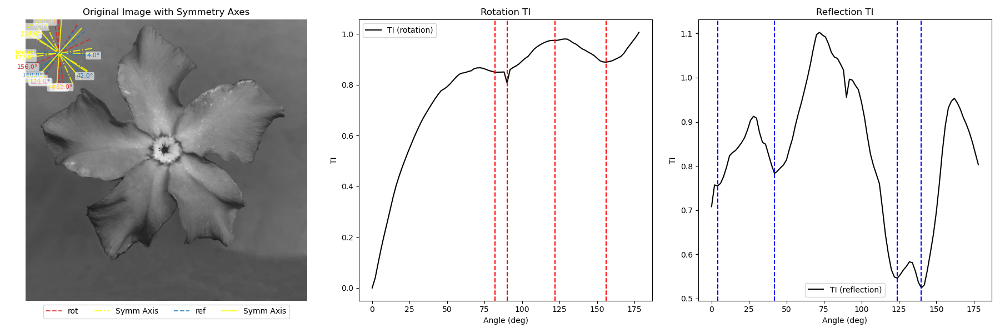

In [3]:
%matplotlib widget

# Find top symmetry directions
N = 4
peaks_rot, _ = find_peaks(-np.array(TI_rot))
peaks_ref, _ = find_peaks(-np.array(TI_ref))
top_rot = np.rad2deg(thetas[peaks_rot[np.argsort(np.array(TI_rot)[peaks_rot])[:N]]])
top_ref = np.rad2deg(thetas[peaks_ref[np.argsort(np.array(TI_ref)[peaks_ref])[:N]]])

def img_symmetry_plotting(img, thetas, top_rot, top_ref, h, w, center):

    # Plot
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # Panel 1: Original image with axes
    axes[0].imshow(img, cmap='gray')
    axes[0].set_title("Original Image with Symmetry Axes")
    axes[0].axis('off')
    
    def draw_axis(ax, angle_deg, color, label=None, semi=None, ls='--'):
        theta = np.deg2rad(angle_deg)
        dx = np.cos(theta)
        dy = np.sin(theta)
        x0, y0 = center
        if semi:
            length = max(h, w)/2
            x1, y1 = x0 , y0
            x2, y2 = x0 + dx * length, y0 + dy * length
            alpha=1
        else:
            length = max(h, w)/2
            x1, y1 = x0 - dx * length, y0 - dy * length
            x2, y2 = x0 + dx * length, y0 + dy * length
            alpha=0.8
        ax.plot([x1, x2], [y1, y2], color=color, linestyle=ls, label=label, linewidth=1.5, alpha=alpha)
    
        # Text annotation at one end
        text_offset = 10
        xt, yt = x2 + text_offset * dx, y2 + text_offset * dy
        ax.text(xt, yt, f"{angle_deg:.1f}°", color=color, fontsize=8, ha='center', va='center',
                bbox=dict(facecolor='white', edgecolor='none', alpha=0.6, boxstyle='round,pad=0.2'))
    
    for i, angle in enumerate(top_rot):
        draw_axis(axes[0], angle, 'C3', 'rot' if i == 0 else None)
        draw_axis(axes[0], (angle+90)%360, 'yellow', 'Symm Axis' if i == 0 else None, semi=None, ls='-.')
    for i, angle in enumerate(top_ref):
        draw_axis(axes[0], angle, 'C0', 'ref' if i == 0 else None)
        draw_axis(axes[0], (angle+90)%360, 'yellow', 'Symm Axis' if i == 0 else None, semi=None, ls='-')
    axes[0].legend(ncol=4, bbox_to_anchor=(0.5, 0), loc='upper center')
    
    # Panel 2: Rotation TI
    axes[1].plot(np.rad2deg(thetas), np.array(TI_rot), 'k', label='TI (rotation)')
    axes[1].set_title('Rotation TI')
    axes[1].set_xlabel('Angle (deg)')
    axes[1].set_ylabel('TI')
    for angle in top_rot:
        axes[1].axvline(x=angle, color='r', linestyle='--')
    axes[1].legend()
    
    # Panel 3: Reflection TI
    axes[2].plot(np.rad2deg(thetas), np.array(TI_ref), 'k', label='TI (reflection)')
    axes[2].set_title('Reflection TI')
    axes[2].set_xlabel('Angle (deg)')
    axes[2].set_ylabel('TI')
    for angle in top_ref:
        axes[2].axvline(x=angle, color='blue', linestyle='--')
    axes[2].legend()
    
    plt.tight_layout()
    plt.show()

img_symmetry_plotting(img, thetas, top_rot, top_ref, h, w, center)

In [4]:
# from matplotlib.colors import LinearSegmentedColormap
from matplotlib.gridspec import GridSpec
from matplotlib.colors import TwoSlopeNorm, LinearSegmentedColormap


def overlay_transformation(img, angle_deg, mode='rotation', displayMode='1-1'):
    """
    Overlay transformation with color-coded differences:
    Original → Cyan, Transformed → Red
    Overlap → White. Includes a colorbar.
    """
    angle_rad = np.deg2rad(angle_deg)
    cos_t, sin_t = np.cos(angle_rad), np.sin(angle_rad)

    if mode == 'rotation':
        M = np.array([
            [cos_t, -sin_t, (1 - cos_t) * center[0] + sin_t * center[1]],
            [sin_t,  cos_t, (1 - cos_t) * center[1] - sin_t * center[0]]
        ], dtype=np.float32)
    elif mode == 'reflection':
        A_ref_y = np.array([[-1, 0], [0, 1]])
        R = np.array([[cos_t, -sin_t], [sin_t, cos_t]])
        A_ref_theta = R @ A_ref_y @ np.linalg.inv(R)
        offset_x = (1 - A_ref_theta[0, 0]) * center[0] - A_ref_theta[0, 1] * center[1]
        offset_y = (1 - A_ref_theta[1, 1]) * center[1] - A_ref_theta[1, 0] * center[0]
        M = np.array([
            [A_ref_theta[0, 0], A_ref_theta[0, 1], offset_x],
            [A_ref_theta[1, 0], A_ref_theta[1, 1], offset_y]
        ], dtype=np.float32)
    else:
        raise ValueError("mode must be 'rotation' or 'reflection'")

    transformed = cv2.warpAffine(img, M, (w, h), flags=cv2.INTER_LINEAR,
                                 borderMode=cv2.BORDER_CONSTANT, borderValue=0)

    # Difference image: signed
    diff = img - transformed

    if displayMode=='1-1':
        # Just -1 to 1 (standard)
        norm = TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)
    else:
        # Compute actual range
        min_diff = np.min(diff)
        max_diff = np.max(diff)
        # max_abs = max(abs(min_diff), abs(max_diff))
        # Symmetric range around 0
        # norm = TwoSlopeNorm(vmin=-max_abs, vcenter=0, vmax=max_abs)
        norm = TwoSlopeNorm(vmin=min_diff, vcenter=0, vmax=max_diff)
        
    cmap = LinearSegmentedColormap.from_list("BlueWhiteOrange", ["blue", "black", "orange"])

    # Layout
    fig = plt.figure(figsize=(10, 6))
    gs = GridSpec(2, 2, width_ratios=[1, 2], height_ratios=[1, 1], wspace=0.05, hspace=0.05)

    ax_orig = fig.add_subplot(gs[0, 0])
    ax_trans = fig.add_subplot(gs[1, 0])
    ax_overlay = fig.add_subplot(gs[:, 1])

    # Grayscale panels
    ax_orig.imshow(img, cmap='gray')
    ax_orig.set_title("Original", fontsize=9)
    ax_orig.axis('off')

    ax_trans.imshow(transformed, cmap='gray')
    ax_trans.set_title("Transformed", fontsize=9, y=0, pad=-10, verticalalignment="top")
    ax_trans.axis('off')

    # Difference heatmap: signed
    im_overlay = ax_overlay.imshow(diff, cmap=cmap, norm=norm)
    ax_overlay.set_title(f'{mode.title()} Difference Overlay at {angle_deg:.1f}°', fontsize=10)
    ax_overlay.axis('off')

    # Colorbar: blue = original > transformed, orange = transformed > original
    cbar = fig.colorbar(im_overlay, ax=ax_overlay, fraction=0.046, pad=0.04)
    cbar.set_label('Transformed − Original', fontsize=9)

    plt.show()

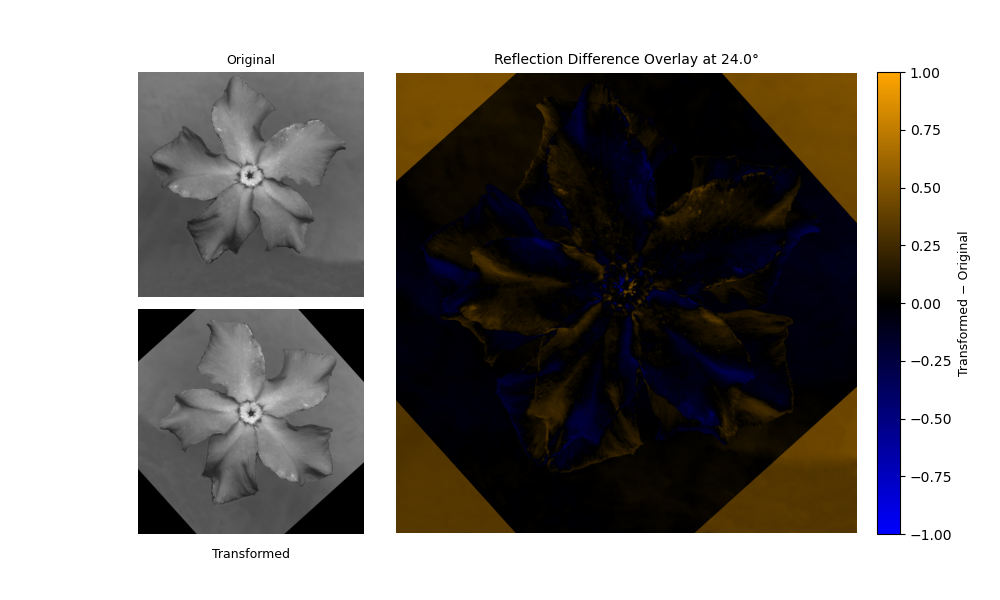

In [154]:
overlay_transformation(img, top_ref[0], mode='reflection')

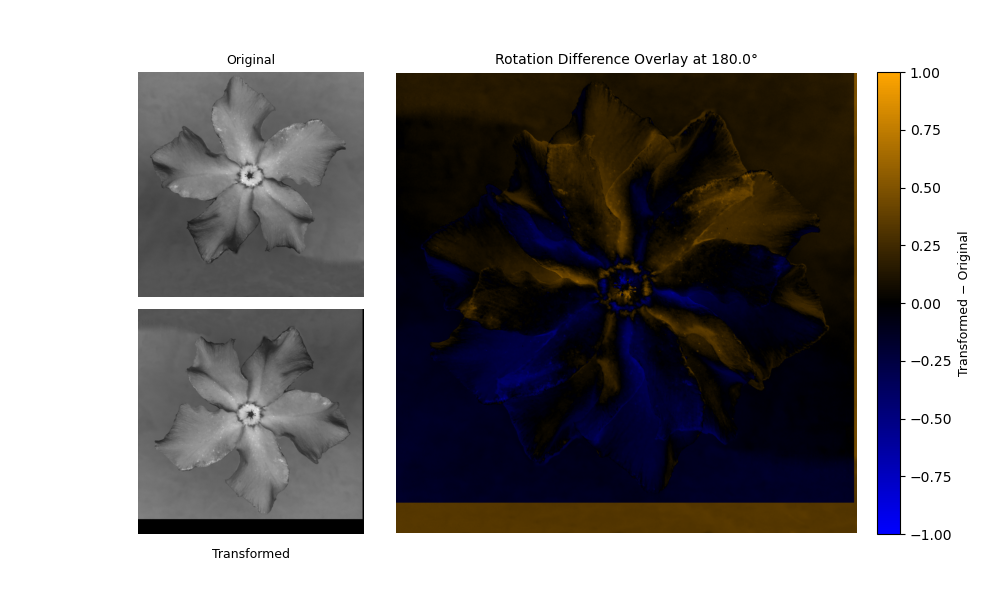

In [91]:
overlay_transformation(img, top_rot[0], mode='rotation')

In [131]:
plt.close('all')

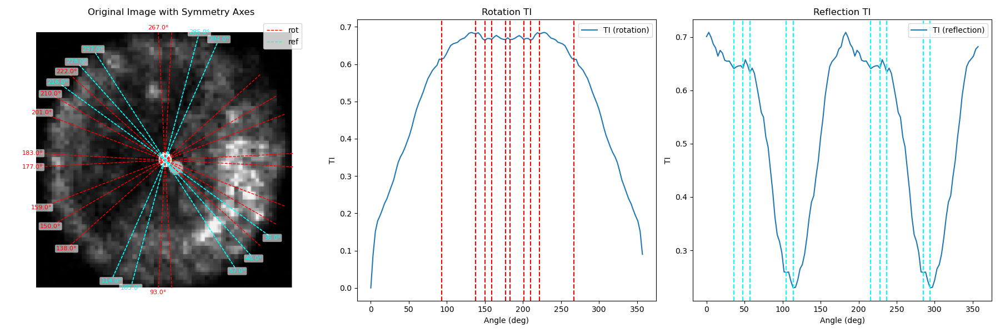

In [132]:
image_path = "panels/panel_1_manual.jpg"
img1 = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
img1 = img1.astype(np.float32) / 255.0

h, w = img1.shape
cntr_offset = [-2, 0]
center = (w // 2 - cntr_offset[0], h // 2 - cntr_offset[1])

# Define angle range
thetas = np.deg2rad(np.arange(0, 360, 3))

TI_rot, TI_ref = img_symmetry_process(img1, thetas, h, w, center)

# Find top symmetry directions
N = 10
peaks_rot, _ = find_peaks(-np.array(TI_rot))
peaks_ref, _ = find_peaks(-np.array(TI_ref))
top_rot = np.rad2deg(thetas[peaks_rot[np.argsort(np.array(TI_rot)[peaks_rot])[:N]]])
top_ref = np.rad2deg(thetas[peaks_ref[np.argsort(np.array(TI_ref)[peaks_ref])[:N]]])

img_symmetry_plotting(img1, thetas, top_rot, top_ref, h, w, center)

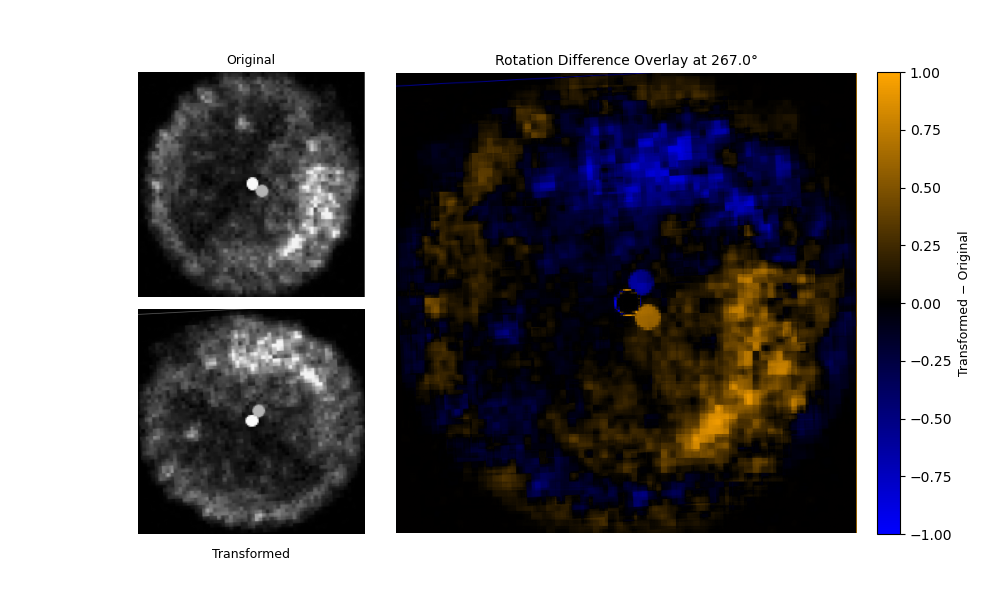

In [133]:
overlay_transformation(img1, top_rot[0], mode='rotation')

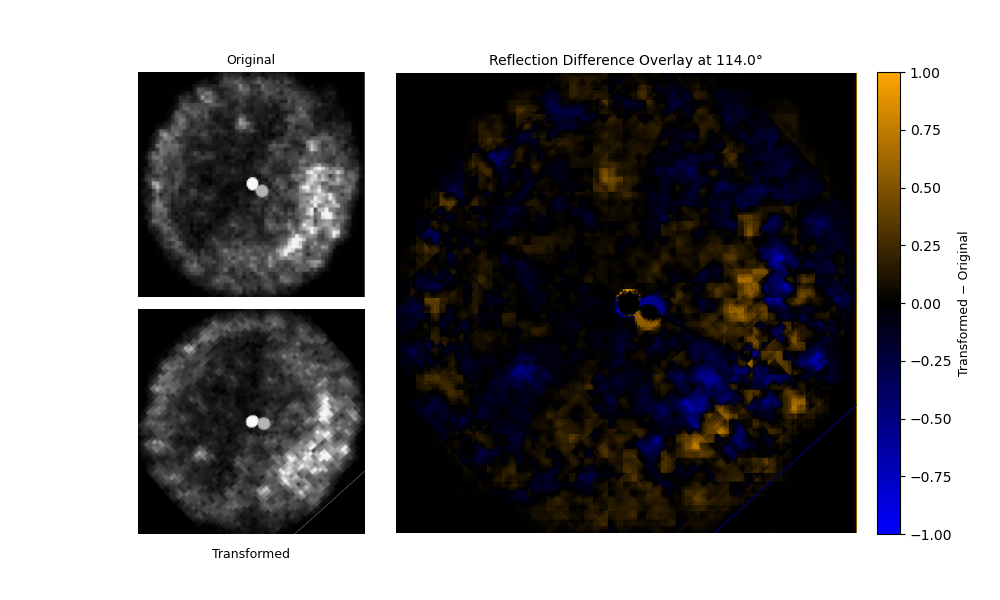

In [134]:
overlay_transformation(img1, top_ref[0], mode='reflection')

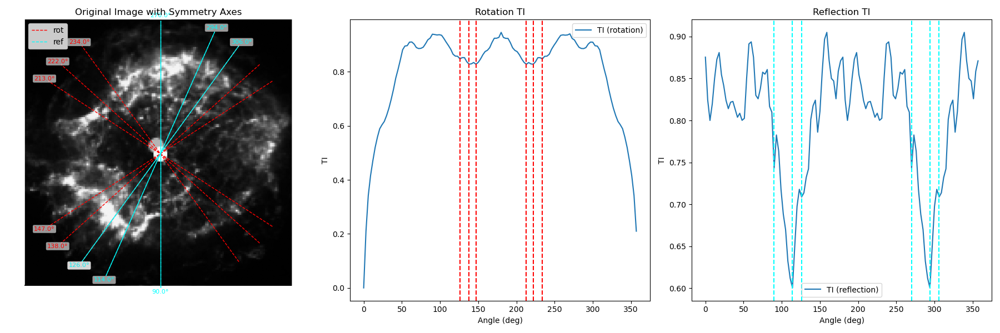

In [35]:
image_path = "panels/panel_12_manual.jpg"
img12 = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
img12 = img12.astype(np.float32) / 255.0

h, w = img12.shape
cntr_offset = [-4.5, -2.5]
center = (w // 2 - cntr_offset[0], h // 2 - cntr_offset[1])

# Define angle range
thetas = np.deg2rad(np.arange(0, 360, 3))

TI_rot, TI_ref = img_symmetry_process(img12, thetas, h, w, center)

# Find top symmetry directions
N = 6
peaks_rot, _ = find_peaks(-np.array(TI_rot))
peaks_ref, _ = find_peaks(-np.array(TI_ref))
top_rot = np.rad2deg(thetas[peaks_rot[np.argsort(np.array(TI_rot)[peaks_rot])[:N]]])
top_ref = np.rad2deg(thetas[peaks_ref[np.argsort(np.array(TI_ref)[peaks_ref])[:N]]])

img_symmetry_plotting(img12, thetas, top_rot, top_ref, h, w, center)

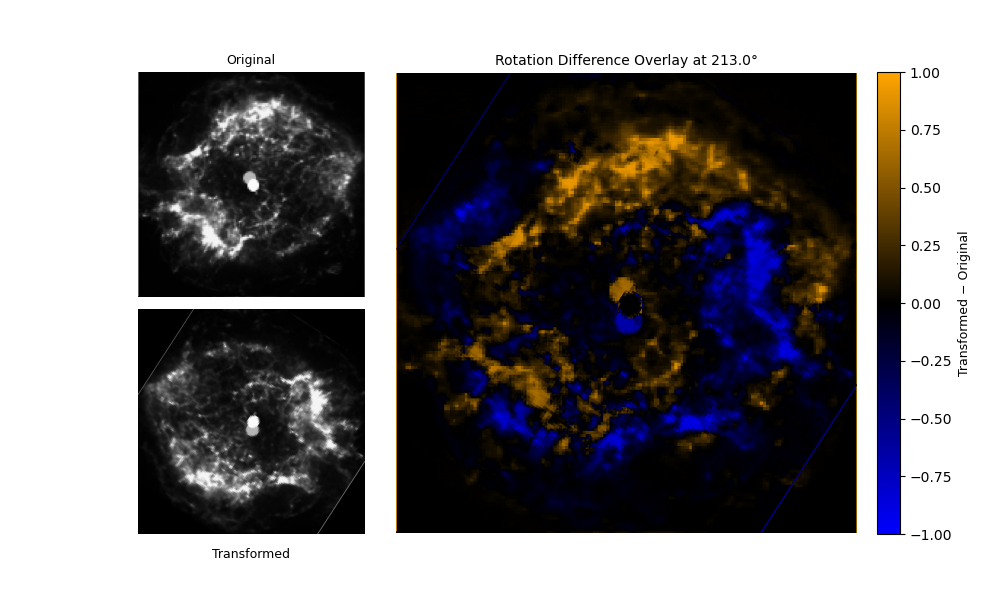

In [36]:
overlay_transformation(img12, top_rot[0], mode='rotation')

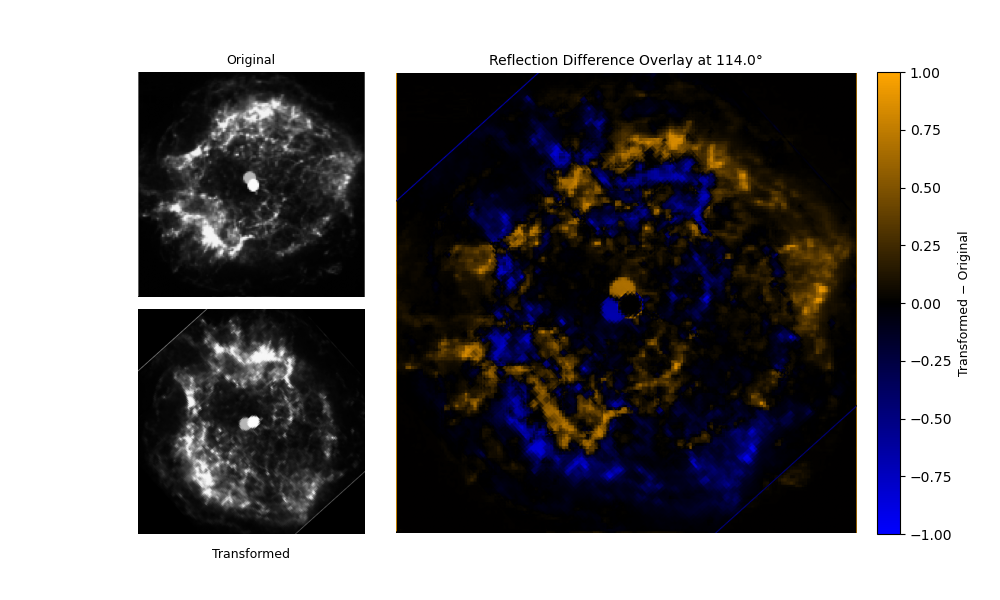

In [37]:
overlay_transformation(img12, top_ref[0], mode='reflection')

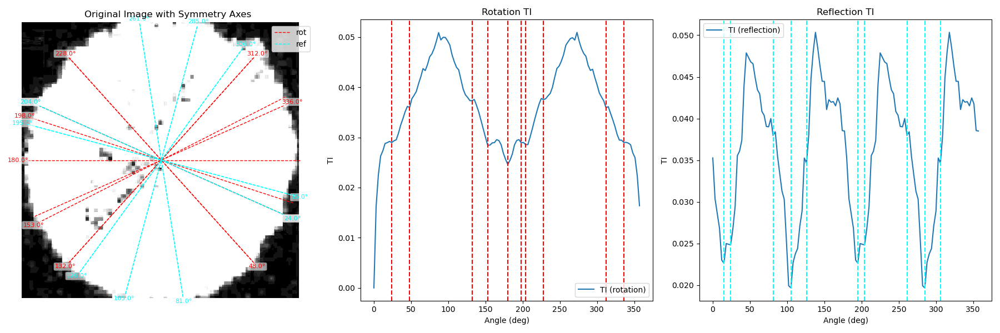

In [38]:
image_path = "panels/panel_1_manual.jpg"
img1 = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
img1 = img1.astype(np.float32) / 255.0
img1 = np.clip(img1, 0, 0.05)

h, w = img1.shape
cntr_offset = [-2, 0]
center = (w // 2 - cntr_offset[0], h // 2 - cntr_offset[1])

# Define angle range
thetas = np.deg2rad(np.arange(0, 360, 3))

TI_rot, TI_ref = img_symmetry_process(img1, thetas, h, w, center)

# Find top symmetry directions
N = 10
peaks_rot, _ = find_peaks(-np.array(TI_rot))
peaks_ref, _ = find_peaks(-np.array(TI_ref))
top_rot = np.rad2deg(thetas[peaks_rot[np.argsort(np.array(TI_rot)[peaks_rot])[:N]]])
top_ref = np.rad2deg(thetas[peaks_ref[np.argsort(np.array(TI_ref)[peaks_ref])[:N]]])

img_symmetry_plotting(img1, thetas, top_rot, top_ref, h, w, center)

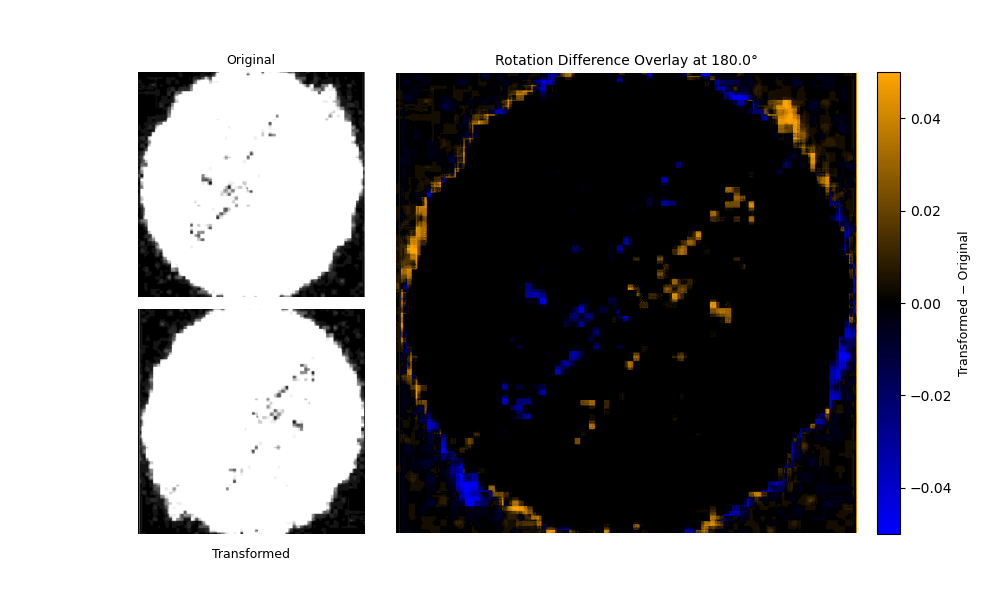

In [39]:
overlay_transformation(img1, top_rot[0], mode='rotation', displayMode='custom')

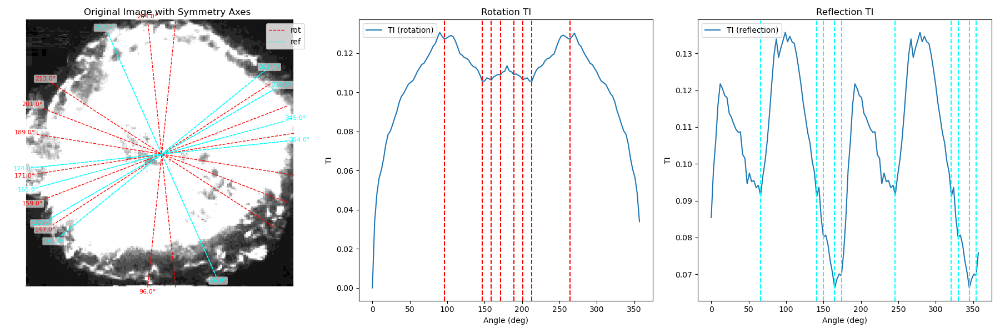

In [40]:
image_path = "panels/panel_12_manual.jpg"
img12 = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
img12 = img12.astype(np.float32) / 255.0
img12 = np.clip(img12, 0, 0.05)

h, w = img12.shape
cntr_offset = [-4.5, -2.5]
center = (w // 2 - cntr_offset[0], h // 2 - cntr_offset[1])

# Define angle range
thetas = np.deg2rad(np.arange(0, 360, 3))

TI_rot, TI_ref = img_symmetry_process(img12, thetas, h, w, center)

# Find top symmetry directions
N = 10
peaks_rot, _ = find_peaks(-np.array(TI_rot))
peaks_ref, _ = find_peaks(-np.array(TI_ref))
top_rot = np.rad2deg(thetas[peaks_rot[np.argsort(np.array(TI_rot)[peaks_rot])[:N]]])
top_ref = np.rad2deg(thetas[peaks_ref[np.argsort(np.array(TI_ref)[peaks_ref])[:N]]])

img_symmetry_plotting(img12, thetas, top_rot, top_ref, h, w, center)

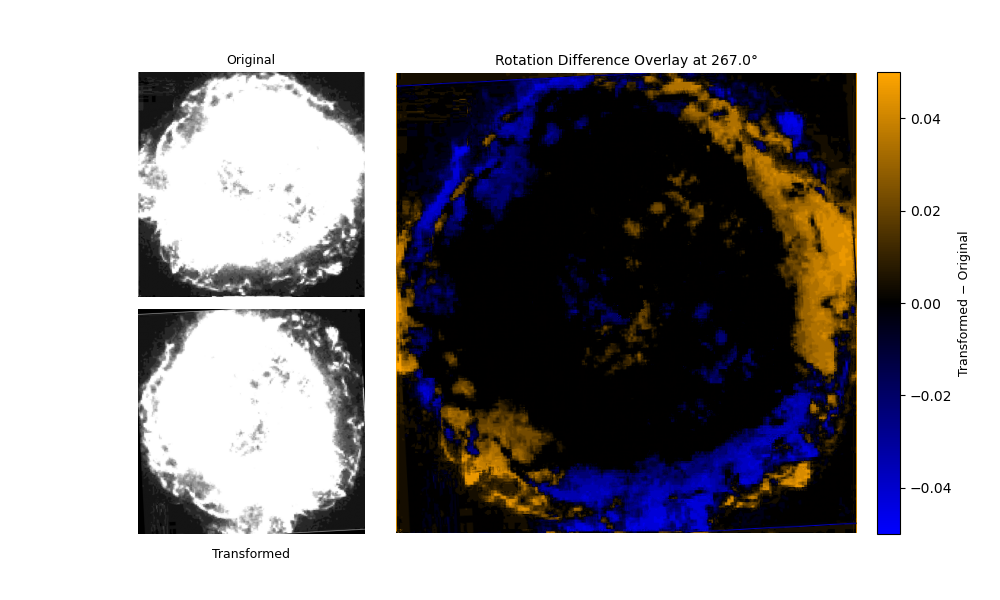

In [46]:
overlay_transformation(img12, top_rot[0], mode='rotation', displayMode='custom')

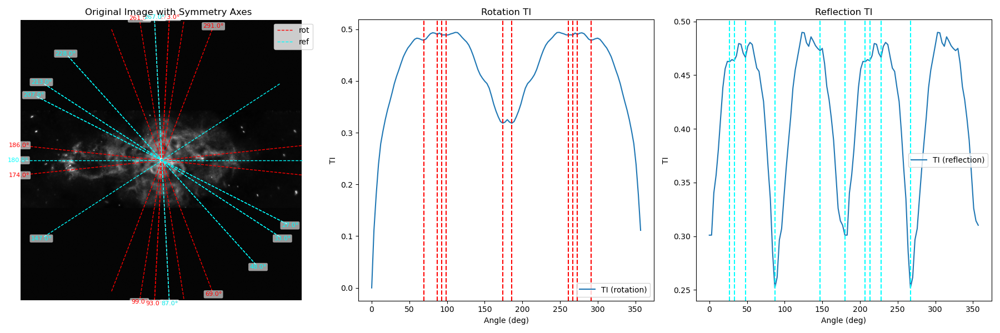

In [136]:
image_path = "panels/3c58.jpg"
imgTEST = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
imgTEST = imgTEST.astype(np.float32) / 255.0

h, w = imgTEST.shape
cntr_offset = [-2, 0]
center = (w // 2 - cntr_offset[0], h // 2 - cntr_offset[1])

# Define angle range
thetas = np.deg2rad(np.arange(0, 360, 3))

TI_rot, TI_ref = img_symmetry_process(imgTEST, thetas, h, w, center)

# Find top symmetry directions
N = 10
peaks_rot, _ = find_peaks(-np.array(TI_rot))
peaks_ref, _ = find_peaks(-np.array(TI_ref))
top_rot = np.rad2deg(thetas[peaks_rot[np.argsort(np.array(TI_rot)[peaks_rot])[:N]]])
top_ref = np.rad2deg(thetas[peaks_ref[np.argsort(np.array(TI_ref)[peaks_ref])[:N]]])

img_symmetry_plotting(imgTEST, thetas, top_rot, top_ref, h, w, center)

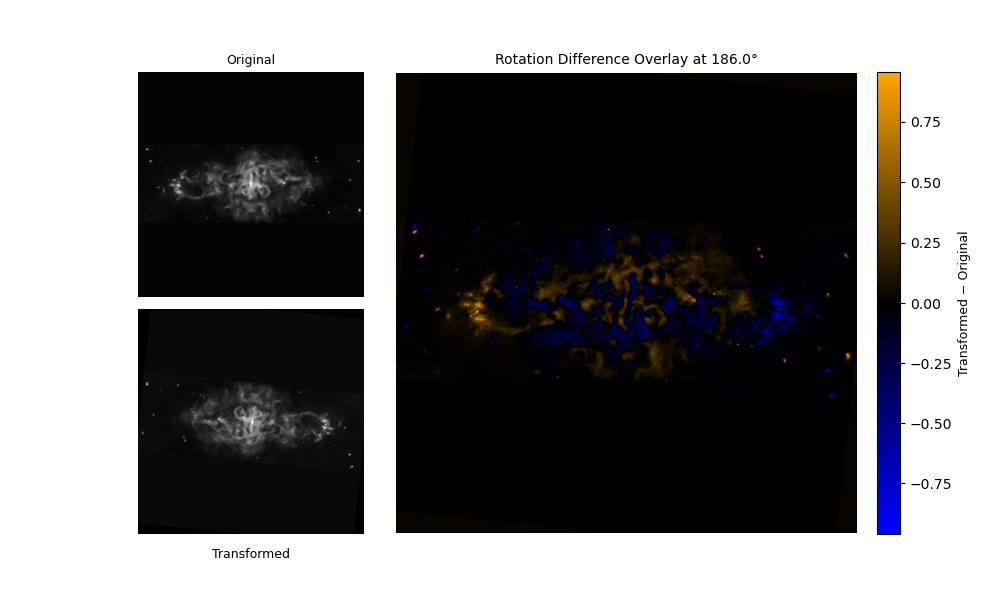

In [137]:
overlay_transformation(imgTEST, top_rot[0], mode='rotation', displayMode='custom')

In [118]:
class PN:
    def __init__(self, path, cntr):
        self.path = path
        self.cntr = cntr

PlanteryNebulae = {
    "NGC 7293": PN("036.2-57.1.NGC7293hst.jpg", (-11, -13)),
    "NGC 6543": PN("096.4+29.9.NGC6543.halo1.jpg", (4, 10)),
    "NGC 5307": PN("312.3+10.5.NGC5307hst.jpg", (-2, 0)),
    "M1-37": PN("002.6-03.4.M1-37hst.jpg", (-2, 2)),
    "MyCn18": PN("307.5-04.9.MyCn18hst.jpg", (0, 15)),
}


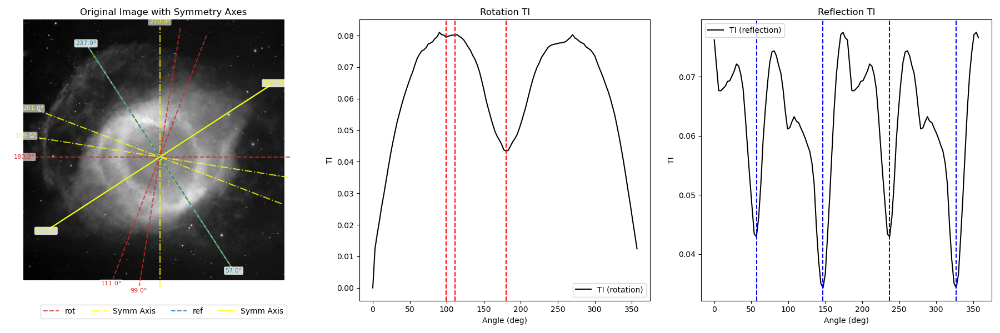

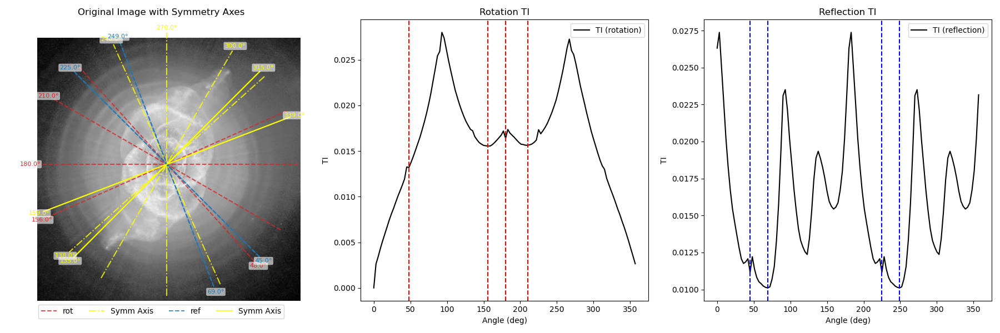

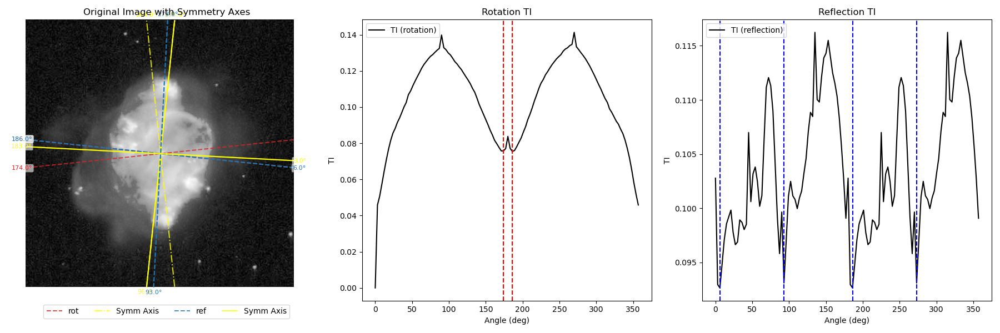

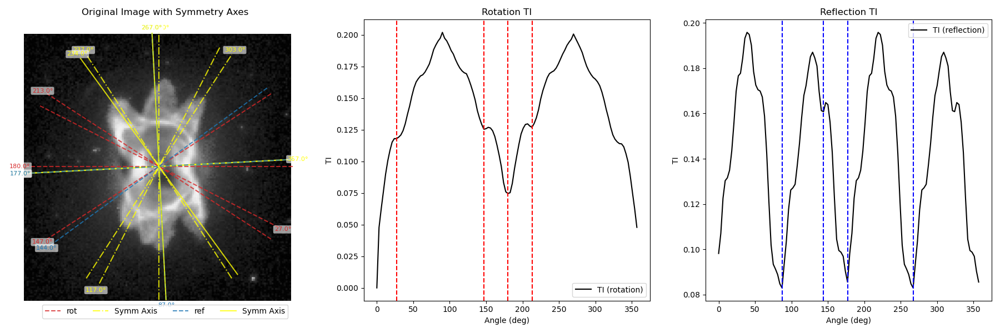

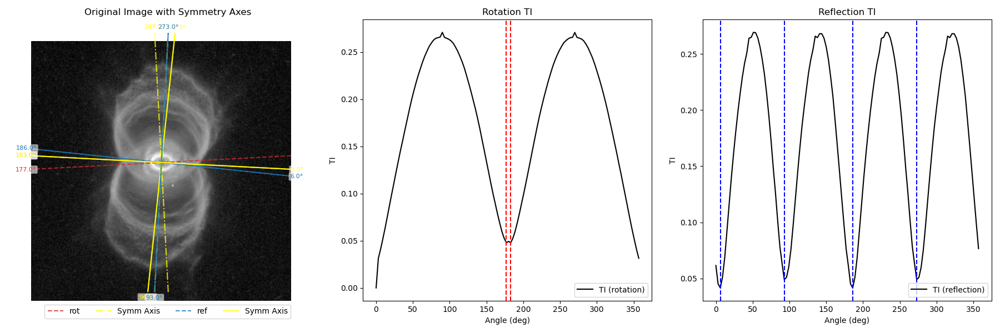

In [132]:
# matplotlib widget

for PNe in PlanteryNebulae.values():

    image_path = PNe.path
    imgTEST = cv2.imread("images/"+image_path, cv2.IMREAD_GRAYSCALE)
    imgTEST = imgTEST.astype(np.float32) / 255.0
    
    h, w = imgTEST.shape
    cntr_offset = PNe.cntr
    center = (w // 2 - cntr_offset[0], h // 2 - cntr_offset[1])
    
    # Define angle range
    thetas = np.deg2rad(np.arange(0, 360, 3))
    
    TI_rot, TI_ref = img_symmetry_process(imgTEST, thetas, h, w, center)
    
    # Find top symmetry directions
    N = 4
    peaks_rot, _ = find_peaks(-np.array(TI_rot))
    peaks_ref, _ = find_peaks(-np.array(TI_ref))
    top_rot = np.rad2deg(thetas[peaks_rot[np.argsort(np.array(TI_rot)[peaks_rot])[:N]]])
    top_ref = np.rad2deg(thetas[peaks_ref[np.argsort(np.array(TI_ref)[peaks_ref])[:N]]])
    
    img_symmetry_plotting(imgTEST, thetas, top_rot, top_ref, h, w, center)

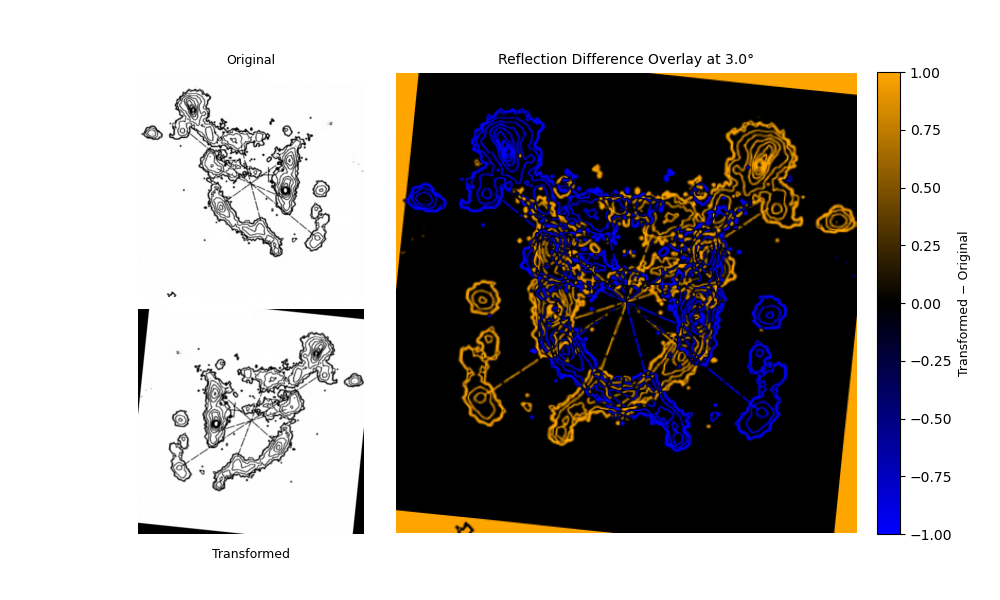

In [152]:
overlay_transformation(imgTEST, top_ref[2], mode='reflection', displayMode='custom')

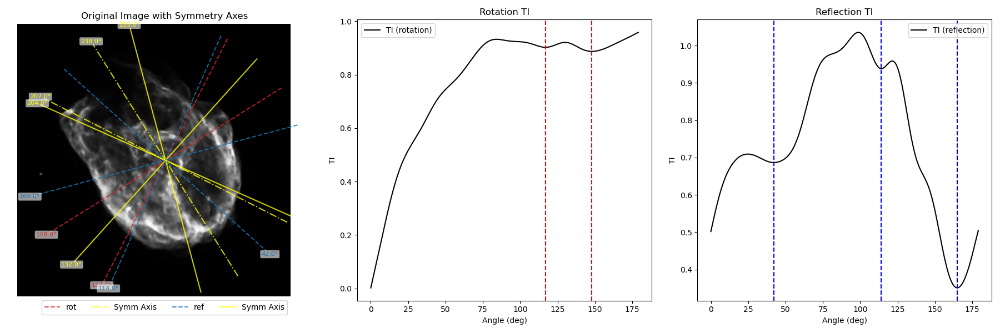

In [82]:
class SNR:
    def __init__(self, path, cntr):
        self.path = path
        self.cntr = cntr

SNRs = {
    # "G321.3-0.9": SNR("G321.jpg", (0, 0)),
    # "S147": SNR("S147.jpg", (0, 0)),
    "N132D": SNR("N132D.jpg", (-30, 0)),
    # "Vela": SNR("Vela.jpg", (0, 0)),
}

def butter_lowpass(normal_cutoff, order=5): #fs
        # nyq = 0.5 * fs
        # normal_cutoff = 0.1
        b, a = signal.butter(order, normal_cutoff, btype='low', analog=False)
        return b, a
def butter_lowpass_filter(data, normal_cutoff, order=5): #cutoff, fs
        b, a = butter_lowpass(normal_cutoff, order=order)
        y = signal.filtfilt(b, a, data)
        return y

for SN in SNRs.values():

    image_path = SN.path
    imgTEST = cv2.imread("images/"+image_path, cv2.IMREAD_GRAYSCALE)
    imgTEST = imgTEST.astype(np.float32) / 255.0
    
    h, w = imgTEST.shape
    cntr_offset = SN.cntr
    center = (w // 2 - cntr_offset[0], h // 2 - cntr_offset[1])
    
    # Define angle range
    disc = 1
    upperdeg = 180
    thetas = np.deg2rad(np.arange(0, upperdeg, disc))
    
    TI_rot, TI_ref = img_symmetry_process(imgTEST, thetas, h, w, center)
    
    # Find top symmetry directions
    N = 5
    TI_rot = butter_lowpass_filter(np.array(TI_rot), normal_cutoff=0.1)
    TI_ref = butter_lowpass_filter(np.array(TI_ref), normal_cutoff=0.1)
    peaks_rot, _ = find_peaks(-TI_rot, width=2*disc, distance=4*disc)
    peaks_ref, _ = find_peaks(-TI_ref, width=2*disc, distance=4*disc)
    top_rot = np.rad2deg(thetas[peaks_rot[np.argsort(np.array(TI_rot)[peaks_rot])[:N]]])
    top_ref = np.rad2deg(thetas[peaks_ref[np.argsort(np.array(TI_ref)[peaks_ref])[:N]]])
    
    img_symmetry_plotting(imgTEST, thetas, top_rot, top_ref, h, w, center)

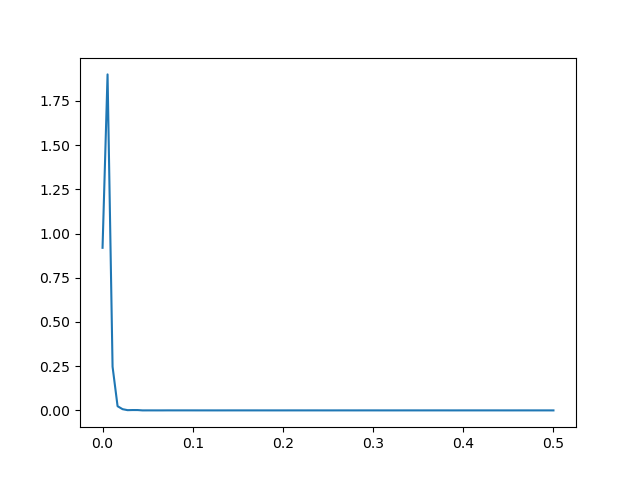

In [68]:
from scipy.signal import welch

f, Pxx = welch(np.array(TI_rot))
plt.figure()
plt.plot(f, Pxx)

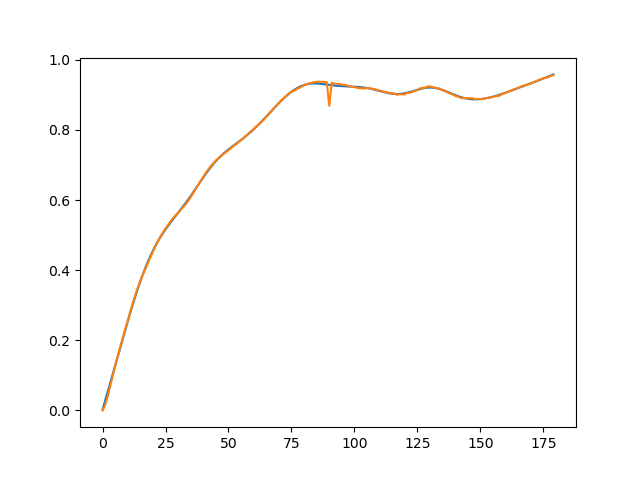

In [80]:
plt.figure()
plt.plot(butter_lowpass_filter(np.array(TI_rot), normal_cutoff=0.1))
plt.plot(np.array(TI_rot))

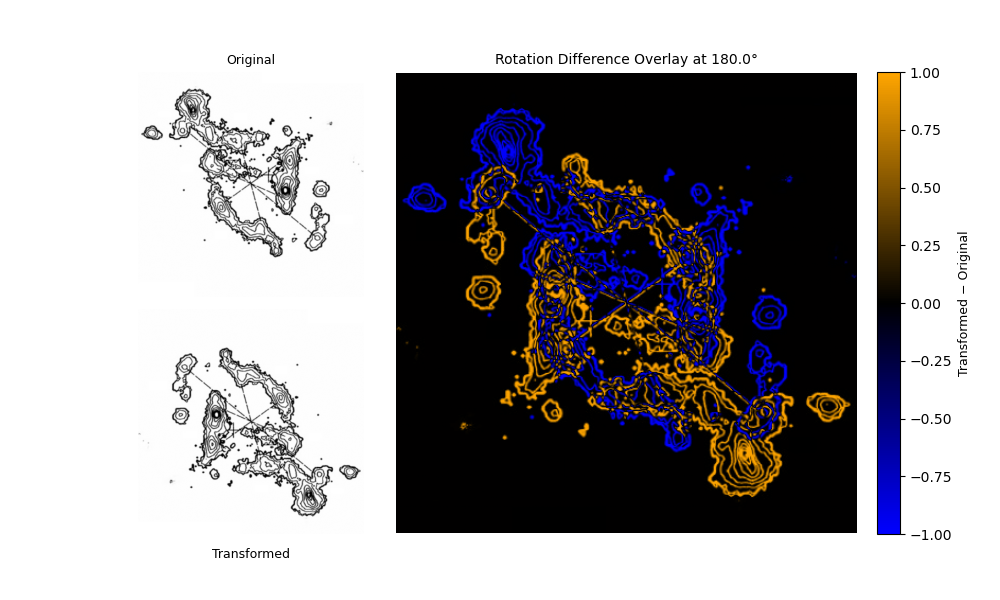

In [154]:
overlay_transformation(imgTEST, 180, mode='rotation') #, displayMode='custom'

In [ ]:
#####
#####
#####
#####

In [58]:
import cv2

img = cv2.imread('Leahy_etal_2025/p5-133.png')

h, w = img.shape[:2]
n_rows = 5
n_full_cols = 5
tile_width = w // n_full_cols
tile_height = h // n_rows

# Output list
tiles = []

# First 4 rows: 5 columns each
for row in range(4):
    for col in range(n_full_cols):
        top = row * tile_height
        left = col * tile_width
        tile = img[top:top + tile_height, left:left + tile_width]
        tiles.append(tile)

# Last row: 4 centered columns
last_row_y = 4 * tile_height
last_row_cols = 4
x_offset = (w - last_row_cols * tile_width) // 2
for col in range(last_row_cols):
    left = x_offset + col * tile_width
    tile = img[last_row_y:last_row_y + tile_height, left:left + tile_width]
    tiles.append(tile)

# Optionally, save tiles
for i, tile in enumerate(tiles):
    cv2.imwrite(f"panel_{i+1}.png", tile)
